
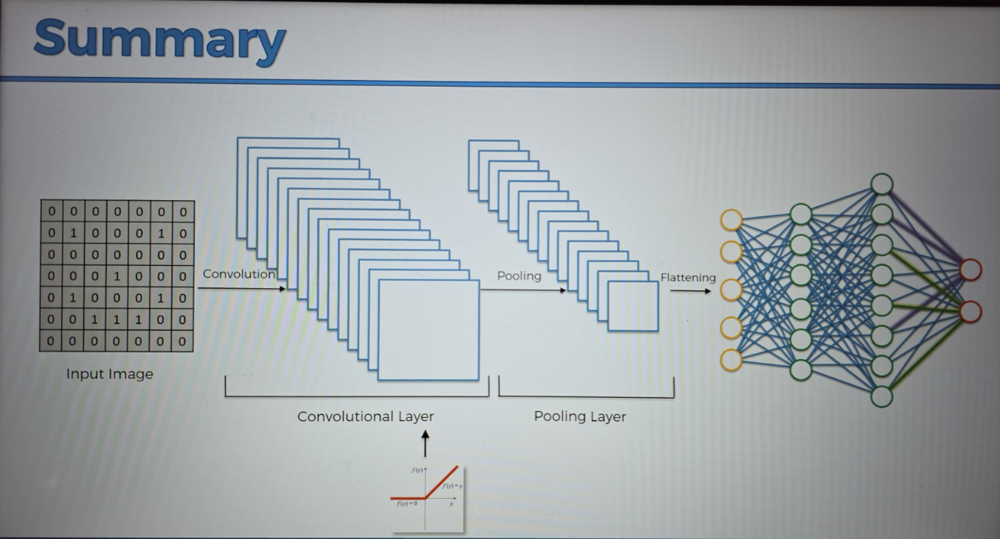

# Complete Guide to Convolutional Neural Networks (CNNs)

## Table of Contents
1. [Introduction to CNNs](#1-introduction-to-cnns)
2. [How Humans vs Computers See Images](#2-how-humans-vs-computers-see-images)
3. [Digital Image Representation](#3-digital-image-representation)
4. [Step 1: Convolution Operation](#4-step-1-convolution-operation)
5. [Step 1b: ReLU Activation](#5-step-1b-relu-activation)
6. [Step 2: Pooling](#6-step-2-pooling)
7. [Step 3: Flattening](#7-step-3-flattening)
8. [Step 4: Fully Connected Layers](#8-step-4-fully-connected-layers)
9. [Complete CNN Architecture](#9-complete-cnn-architecture)
10. [Key Takeaways](#10-key-takeaways)

---

## 1. Introduction to CNNs

### What are Convolutional Neural Networks?
CNNs are a type of deep learning model specifically designed for processing images. They mimic how the human brain processes visual information by detecting features and patterns.

### Why are CNNs Important?
- **Computer Vision**: Image classification, object detection
- **Medical Imaging**: Tumor detection, X-ray analysis
- **Autonomous Vehicles**: Road sign recognition, obstacle detection
- **Social Media**: Automatic photo tagging
- **Security**: Facial recognition systems

### The Four Main Steps of CNNs
```
Input Image → Convolution → ReLU → Pooling → Flattening → Fully Connected → Output
```

---

## 2. How Humans vs Computers See Images

### Human Visual Perception
Humans recognize images based on **features**:
- **Example 1**: Young Lady vs Old Lady optical illusion
  - Young lady features: coat, hair, feather
  - Old lady features: nose, mouth, chin, scarf
- **Example 2**: Duck vs Rabbit illusion
  - Same image, different feature interpretation

### Computer Vision with CNNs
```
Input: Cheetah Image
↓
CNN Processing
↓
Output Probabilities:
- Cheetah: 85%
- Leopard: 10%
- Snow Leopard: 3%
- Egyptian Cat: 2%
```

### Key Insight
Both humans and CNNs classify images by detecting and interpreting **features**, but sometimes uncertainty exists in both systems.

---

## 3. Digital Image Representation

### Grayscale Images (2D Array)
```
Black & White Image Representation:
┌─────────────────┐
│  0  128  255    │  ← Pixel values
│ 64   200  180   │     0 = Black
│ 255   90   45   │   255 = White
└─────────────────┘     128 = Gray
```

### Color Images (3D Array - RGB)
```
Color Image = 3 Layers:
┌─── Red Layer ────┐  ┌─── Green Layer ──┐  ┌─── Blue Layer ───┐
│ 255  128   64    │  │  128  200  255   │  │   64  100  180   │
│  180  255  200   │  │   90  180  128   │  │  255  128   90   │
│   90  200  255   │  │  255   64  180   │  │  128  255  200   │
└─────────────────┘  └─────────────────┘  └─────────────────┘
        ↓                      ↓                      ↓
    Red Values            Green Values           Blue Values
   (0-255 each)          (0-255 each)          (0-255 each)
```

### Simplified Example for Learning
For easier understanding, we'll use binary representation:
- **0** = White pixel
- **1** = Black pixel

```
Simple Smiley Face (7x7):
┌───────────────────────────┐
│ 0  0  1  1  1  0  0 │
│ 0  1  0  0  0  1  0 │
│ 1  0  1  0  1  0  1 │
│ 1  0  0  0  0  0  1 │
│ 1  0  1  0  1  0  1 │
│ 0  1  0  1  0  1  0 │
│ 0  0  1  1  1  0  0 │
└───────────────────────────┘
```

---

## 4. Step 1: Convolution Operation

### What is Convolution?
Convolution is the process of applying **feature detectors** (filters) to an image to detect specific patterns or features.

### Key Components:
- **Input Image**: Original image matrix
- **Feature Detector/Filter/Kernel**: Small matrix (usually 3x3)
- **Feature Map**: Output after convolution
- **Stride**: Step size for moving the filter

### Convolution Process Visualization

#### Step-by-Step Example:

**Input Image (7x7):**
```
┌─────────────────────────────┐
│ 0  0  1  1  1  0  0 │
│ 0  1  0  0  0  1  0 │
│ 1  0  1  0  1  0  1 │
│ 1  0  0  0  0  0  1 │
│ 1  0  1  0  1  0  1 │
│ 0  1  0  1  0  1  0 │
│ 0  0  1  1  1  0  0 │
└─────────────────────────────┘
```

**Feature Detector (3x3):**
```
┌───────────┐
│ 1  0  1 │
│ 0  1  0 │
│ 1  0  1 │
└───────────┘
```

#### Convolution Calculation:
```
Position 1 (Top-left):
┌───────────┐      ┌───────────┐
│ 0  0  1 │  ×   │ 1  0  1 │  = (0×1)+(0×0)+(1×1)+(0×0)+(1×1)+(0×0)+(1×1)+(0×0)+(1×1) = 4
│ 0  1  0 │      │ 0  1  0 │
│ 1  0  1 │      │ 1  0  1 │
└───────────┘      └───────────┘

Position 2 (Move right by stride=1):
┌───────────┐      ┌───────────┐
│ 0  1  1 │  ×   │ 1  0  1 │  = (0×1)+(1×0)+(1×1)+(1×0)+(0×1)+(0×0)+(0×1)+(0×0)+(1×1) = 2
│ 1  0  0 │      │ 0  1  0 │
│ 0  1  0 │      │ 1  0  1 │
└───────────┘      └───────────┘
```

**Resulting Feature Map (5x5):**
```
┌─────────────────────┐
│ 4  2  3  2  1 │
│ 2  1  2  1  3 │
│ 2  3  2  3  2 │
│ 2  1  2  1  2 │
│ 1  2  3  2  4 │
└─────────────────────┘
```

### Different Types of Feature Detectors:

#### Edge Detection Filter:
```
┌─────────────┐
│ -1  -1  -1 │  ← Detects horizontal edges
│  0   0   0 │
│  1   1   1 │
└─────────────┘
```

#### Blur Filter:
```
┌─────────────────────┐
│ 1/9  1/9  1/9 │  ← Averages surrounding pixels
│ 1/9  1/9  1/9 │
│ 1/9  1/9  1/9 │
└─────────────────────┘
```

#### Sharpen Filter:
```
┌─────────────┐
│  0  -1   0 │  ← Enhances edges
│ -1   5  -1 │
│  0  -1   0 │
└─────────────┘
```

### Multiple Feature Maps
In real CNNs, we use **multiple filters** to detect different features:

```
Input Image → Filter 1 → Feature Map 1 (detects vertical edges)
            → Filter 2 → Feature Map 2 (detects horizontal edges)
            → Filter 3 → Feature Map 3 (detects diagonal patterns)
            → Filter 4 → Feature Map 4 (detects curves)
            ...
            → Filter N → Feature Map N
```

### Benefits of Convolution:
1. **Feature Detection**: Identifies important patterns
2. **Size Reduction**: Reduces image dimensions
3. **Spatial Relationships**: Preserves local patterns
4. **Parameter Sharing**: Same filter used across entire image

---

## 5. Step 1b: ReLU Activation

### What is ReLU?
ReLU (Rectified Linear Unit) is an activation function that introduces **non-linearity** into the network.

### ReLU Function:
```
f(x) = max(0, x)

If x > 0: output = x
If x ≤ 0: output = 0
```

### Why Do We Need ReLU?

#### Problem: Linear Images
Images contain non-linear elements:
- Shadows and lighting changes
- Object boundaries
- Color transitions
- Texture variations

#### Solution: ReLU Introduces Non-linearity

**Before ReLU (Feature Map with negative values):**
```
┌─────────────────────────────┐
│ -2  -1   3   4   2 │
│  1  -3   2  -1   5 │
│  4   2  -2   3  -1 │
│ -1   5   1  -2   4 │
│  3  -2   4   1  -3 │
└─────────────────────────────┘
```

**After ReLU (All negative values become 0):**
```
┌─────────────────────────────┐
│  0   0   3   4   2 │
│  1   0   2   0   5 │
│  4   2   0   3   0 │
│  0   5   1   0   4 │
│  3   0   4   1   0 │
└─────────────────────────────┘
```

### Visual Example:
```
Original Feature Map:        After ReLU:
Black = Negative            Black areas removed
White = Positive           Only positive values remain
Gray = Zero                

███▓▓▓░░░              ░░░░░░░░░
▓▓███░░▓▓     →        ░░░░░░░▓▓
░░▓▓███▓               ░░░▓▓░░░▓
```

### Benefits of ReLU:
1. **Non-linearity**: Breaks linear progressions
2. **Computational Efficiency**: Simple max(0,x) operation
3. **Avoids Vanishing Gradient**: Doesn't saturate for positive values
4. **Sparsity**: Creates sparse representations (many zeros)

---

## 6. Step 2: Pooling

### What is Pooling?
Pooling reduces the spatial dimensions of feature maps while preserving important information. It provides **spatial invariance**.

### Why Do We Need Pooling?

#### The Problem: Object Variations
```
Cheetah Image Variations:
┌─────────────┐  ┌─────────────┐  ┌─────────────┐
│   🐆        │  │      🐆     │  │  🐆         │
│    Normal   │  │   Rotated   │  │  Squashed   │
│   Position  │  │   Position  │  │  Position   │
└─────────────┘  └─────────────┘  └─────────────┘
```

We need the CNN to recognize ALL as cheetahs!

### Max Pooling Process

#### Step-by-Step Example:

**Input Feature Map (4x4):**
```
┌─────────────────┐
│  1   3   2   4 │
│  5   6   1   2 │
│  3   2   4   7 │
│  1   8   3   5 │
└─────────────────┘
```

**Max Pooling with 2x2 window, stride=2:**

```
Window 1 (Top-left):        Window 2 (Top-right):
┌─────────┐                 ┌─────────┐
│ 1   3 │ → max = 6       │ 2   4 │ → max = 4
│ 5   6 │                 │ 1   2 │
└─────────┘                 └─────────┘

Window 3 (Bottom-left):     Window 4 (Bottom-right):
┌─────────┐                 ┌─────────┐
│ 3   2 │ → max = 8       │ 4   7 │ → max = 7
│ 1   8 │                 │ 3   5 │
└─────────┘                 └─────────┘
```

**Output Pooled Feature Map (2x2):**
```
┌─────────┐
│ 6   4 │
│ 8   7 │
└─────────┘
```

### Spatial Invariance Example:

**Original Feature (Cheetah's eye pattern):**
```
┌─────────────────┐
│ 0  0  8  9  0 │
│ 0  7  9  8  0 │
│ 6  8  9  0  0 │
│ 0  0  0  0  0 │
└─────────────────┘
```

**Slightly Shifted Feature:**
```
┌─────────────────┐
│ 0  0  0  8  9 │
│ 0  0  7  9  8 │
│ 0  6  8  9  0 │
│ 0  0  0  0  0 │
└─────────────────┘
```

**After Max Pooling (2x2):**
Both produce similar pooled results:
```
┌─────────┐
│ 7  9 │
│ 8  9 │
└─────────┘
```

### Types of Pooling:

#### 1. Max Pooling (Most Common):
```
┌─────────┐
│ 1   4 │ → max = 4
│ 2   3 │
└─────────┘
```

#### 2. Average Pooling:
```
┌─────────┐
│ 1   4 │ → avg = (1+4+2+3)/4 = 2.5
│ 2   3 │
└─────────┘
```

#### 3. Sum Pooling:
```
┌─────────┐
│ 1   4 │ → sum = 1+4+2+3 = 10
│ 2   3 │
└─────────┘
```

### Benefits of Pooling:
1. **Spatial Invariance**: Handles small translations/rotations
2. **Dimensionality Reduction**: Reduces computational load
3. **Feature Preservation**: Keeps most important activations
4. **Overfitting Prevention**: Reduces parameters

### Common Pooling Parameters:
- **Window Size**: Usually 2x2 or 3x3
- **Stride**: Usually 2 (non-overlapping)
- **Type**: Max pooling most common

---

## 7. Step 3: Flattening

### What is Flattening?
Flattening converts the 2D pooled feature maps into a 1D vector to feed into fully connected layers.

### Flattening Process:

#### Single Feature Map Example:
**Pooled Feature Map (3x3):**
```
┌─────────────┐
│ 4  7  2 │
│ 1  9  3 │
│ 6  5  8 │
└─────────────┘
```

**After Flattening (1x9 vector):**
```
[4, 7, 2, 1, 9, 3, 6, 5, 8]
```

#### Multiple Feature Maps Example:
```
Feature Map 1:        Feature Map 2:        Feature Map 3:
┌─────────┐          ┌─────────┐          ┌─────────┐
│ 4  7 │            │ 2  1 │            │ 8  3 │
│ 1  9 │            │ 5  6 │            │ 2  7 │
└─────────┘          └─────────┘          └─────────┘
     ↓                     ↓                     ↓
   [4,7,1,9]            [2,1,5,6]            [8,3,2,7]
                             ↓
                    Concatenated Vector:
              [4, 7, 1, 9, 2, 1, 5, 6, 8, 3, 2, 7]
```

### Why Flattening?
```
2D Feature Maps → Cannot directly connect to → Fully Connected Layers
                                                      ↓
1D Flattened Vector → Can connect to → Fully Connected Layers
```

### Complete Process So Far:
```
Input Image (28x28)
        ↓
Convolution + ReLU → Feature Maps (26x26)
        ↓
Max Pooling → Pooled Feature Maps (13x13)
        ↓
Flattening → 1D Vector (169 elements)
        ↓
Ready for Fully Connected Layers
```

---

## 8. Step 4: Fully Connected Layers

### What are Fully Connected Layers?
Fully connected layers are traditional neural network layers where every neuron connects to every neuron in the next layer. They combine features to make final predictions.

### Architecture Example:

```
Flattened Input → Hidden Layer 1 → Hidden Layer 2 → Output Layer
   (169 neurons)    (120 neurons)    (84 neurons)    (2 neurons)
                                                     [Dog, Cat]
```

### Detailed Example: Dog vs Cat Classification

#### Network Structure:
```
Input Layer: [f1, f2, f3, f4, f5] (5 features from flattening)
              ↓  ↓  ↓  ↓  ↓
Hidden Layer: [h1, h2, h3, h4, h5, h6] (6 neurons)
              ↓           ↓
Output Layer: [Dog_neuron, Cat_neuron] (2 classes)
```

#### Feature Representation:
```
Feature Neurons might represent:
f1 = Floppy ears detection (0.8)
f2 = Pointy ears detection (0.2)
f3 = Whiskers detection (0.1)
f4 = Wet nose detection (0.9)
f5 = Fur pattern detection (0.7)
```

#### Weight Learning Process:

**For Dog Classification:**
```
When training with dog images:

Dog Neuron learns weights:
- High weight for f1 (floppy ears) = +0.9
- Low weight for f2 (pointy ears) = +0.1
- Low weight for f3 (whiskers) = +0.1
- High weight for f4 (wet nose) = +0.8
- Medium weight for f5 (fur pattern) = +0.5

Dog Score = (0.8×0.9) + (0.2×0.1) + (0.1×0.1) + (0.9×0.8) + (0.7×0.5)
         = 0.72 + 0.02 + 0.01 + 0.72 + 0.35 = 1.82
```

**For Cat Classification:**
```
Cat Neuron learns weights:
- Low weight for f1 (floppy ears) = +0.1
- High weight for f2 (pointy ears) = +0.9
- High weight for f3 (whiskers) = +0.8
- Medium weight for f4 (wet nose) = +0.4
- Medium weight for f5 (fur pattern) = +0.6

Cat Score = (0.8×0.1) + (0.2×0.9) + (0.1×0.8) + (0.9×0.4) + (0.7×0.6)
         = 0.08 + 0.18 + 0.08 + 0.36 + 0.42 = 1.12
```

#### Final Prediction:
```
Raw Scores: Dog = 1.82, Cat = 1.12

After Softmax (converts to probabilities):
Dog Probability = exp(1.82) / (exp(1.82) + exp(1.12)) = 0.67 = 67%
Cat Probability = exp(1.12) / (exp(1.82) + exp(1.12)) = 0.33 = 33%

Prediction: DOG (higher probability)
```

### Training Process (Backpropagation):

#### Forward Pass:
```
Input → Convolution → ReLU → Pooling → Flatten → FC Layers → Output
  🐕        ↓         ↓       ↓        ↓         ↓         [0.67, 0.33]
```

#### Error Calculation:
```
Predicted: [0.67, 0.33] (Dog=67%, Cat=33%)
True Label: [1, 0] (Actually a dog)
Error = True - Predicted = [0.33, -0.33]
```

#### Backward Pass (Backpropagation):
```
Error → Adjust FC Weights → Adjust Conv Filters → Update All Parameters
```

### Multi-Class Example (3 classes):

```
Output Layer for [Dog, Cat, Bird]:

Input features detect:
- Feathers: 0.9
- Wings: 0.8
- Beak: 0.7
- Floppy ears: 0.1
- Whiskers: 0.0

Dog Neuron: (0.9×0.1) + (0.8×0.1) + (0.7×0.1) + (0.1×0.9) + (0.0×0.1) = 0.33
Cat Neuron: (0.9×0.1) + (0.8×0.1) + (0.7×0.1) + (0.1×0.1) + (0.0×0.9) = 0.25
Bird Neuron: (0.9×0.9) + (0.8×0.8) + (0.7×0.8) + (0.1×0.1) + (0.0×0.1) = 2.06

Prediction: BIRD (highest score)
```

---

## 9. Complete CNN Architecture

### Full CNN Pipeline:

```
┌─────────────────────────────────────────────────────────────────────┐
│                          COMPLETE CNN ARCHITECTURE                   │
└─────────────────────────────────────────────────────────────────────┘

Input Image (28×28×3)
        ↓
┌─────────────────┐
│  CONVOLUTION    │ → Apply 32 filters (3×3) → 32 feature maps (26×26)
│    + ReLU       │
└─────────────────┘
        ↓
┌─────────────────┐
│   MAX POOLING   │ → Pool size (2×2) → 32 feature maps (13×13)
│   (Stride=2)    │
└─────────────────┘
        ↓
┌─────────────────┐
│  CONVOLUTION    │ → Apply 64 filters (3×3) → 64 feature maps (11×11)
│    + ReLU       │
└─────────────────┘
        ↓
┌─────────────────┐
│   MAX POOLING   │ → Pool size (2×2) → 64 feature maps (5×5)
│   (Stride=2)    │
└─────────────────┘
        ↓
┌─────────────────┐
│   FLATTENING    │ → Flatten → 1D vector (1600 neurons)
└─────────────────┘
        ↓
┌─────────────────┐
│ FULLY CONNECTED │ → 128 neurons
│   (Hidden 1)    │
└─────────────────┘
        ↓
┌─────────────────┐
│ FULLY CONNECTED │ → 64 neurons
│   (Hidden 2)    │
└─────────────────┘
        ↓
┌─────────────────┐
│ FULLY CONNECTED │ → 10 neurons (for 10 classes)
│   (Output)      │
└─────────────────┘
        ↓
Final Prediction: [0.1, 0.05, 0.8, 0.02, 0.01, 0.01, 0.01, 0.0, 0.0, 0.0]
                   Class 2 has highest probability (80%)
```

### Real-World Example: CIFAR-10 Classification

```
Classes: [Airplane, Automobile, Bird, Cat, Deer, Dog, Frog, Horse, Ship, Truck]

Input: 32×32×3 color image of a cat
         ↓
Conv Layer 1: 32 filters detect basic features (edges, colors)
         ↓
Pool Layer 1: Reduces size, maintains important features
         ↓
Conv Layer 2: 64 filters detect complex features (shapes, patterns)
         ↓
Pool Layer 2: Further size reduction
         ↓
Flatten: Convert to 1D for classification
         ↓
FC Layers: Combine features for final decision
         ↓
Output: [0.05, 0.03, 0.12, 0.78, 0.01, 0.08, 0.02, 0.01, 0.04, 0.03]
         Prediction: CAT (78% confidence)
```

### Parameter Count Example:

```
Layer                  | Parameters
----------------------|------------
Conv1 (32 filters 3×3)| 32 × (3×3×3 + 1) = 896
Conv2 (64 filters 3×3)| 64 × (3×3×32 + 1) = 18,496
FC1 (1600 → 128)      | 1600 × 128 + 128 = 204,928
FC2 (128 → 64)        | 128 × 64 + 64 = 8,256
FC3 (64 → 10)         | 64 × 10 + 10 = 650
----------------------|------------
Total Parameters       | 233,226
```

---

## 10. Key Takeaways

### CNN Components Summary:

#### 1. **Convolution Layer**
- **Purpose**: Feature detection
- **How**: Applies filters to detect patterns
- **Output**: Feature maps
- **Key Parameters**: Filter size, number of filters, stride

#### 2. **ReLU Activation**
- **Purpose**: Introduce non-linearity
- **How**: Sets negative values to zero
- **Output**: Non-linear feature maps
- **Benefit**: Enables learning complex patterns

#### 3. **Pooling Layer**
- **Purpose**: Spatial invariance and dimensionality reduction
- **How**: Takes maximum (or average) in windows
- **Output**: Smaller feature maps
- **Benefit**: Handles object variations

#### 4. **Flattening**
- **Purpose**: Prepare for fully connected layers
- **How**: Converts 2D to 1D
- **Output**: Long vector
- **Necessity**: Bridge between conv and FC layers

#### 5. **Fully Connected Layers**
- **Purpose**: Classification/regression
- **How**: Traditional neural network
- **Output**: Class probabilities
- **Learning**: Combines features for decisions

### CNN Advantages:
1. **Spatial Hierarchy**: Learns from simple to complex features
2. **Parameter Sharing**: Efficient use of parameters
3. **Translation Invariance**: Robust to object positions
4. **Automatic Feature Learning**: No manual feature engineering

### Common CNN Architectures:
- **LeNet-5**: First successful CNN (1998)
- **AlexNet**: ImageNet winner (2012)
- **VGGNet**: Deep networks with small filters (2014)
- **ResNet**: Skip connections for very deep networks (2015)
- **EfficientNet**: Optimal scaling (2019)

### Best Practices:
1. **Data Augmentation**: Rotate, flip, zoom images
2. **Regularization**: Dropout, batch normalization
3. **Transfer Learning**: Use pre-trained models
4. **Proper Initialization**: Xavier/He initialization
5. **Learning Rate Scheduling**: Reduce over time

### Applications Beyond Image Classification:
- **Object Detection**: YOLO, R-CNN
- **Semantic Segmentation**: U-Net, FCN
- **Style Transfer**: Neural style networks
- **Medical Imaging**: Disease detection
- **Autonomous Driving**: Computer vision systems

---

## Additional Resources

### Recommended Papers:
1. "Gradient-Based Learning Applied to Document Recognition" - Yann LeCun
2. "ImageNet Classification with Deep Convolutional Neural Networks" - AlexNet
3. "Very Deep Convolutional Networks for Large-Scale Image Recognition" - VGGNet

### Online Tools:
- **ConvNetJS**: Interactive CNN visualization
- **TensorFlow Playground**: Neural network visualization
- **Distill.pub**: Visual explanations of ML concepts

### Practice Datasets:
- **MNIST**: Handwritten digits (beginner)
- **CIFAR-10**: Small images, 10 classes (intermediate)
- **ImageNet**: Large-scale image classification (advanced)


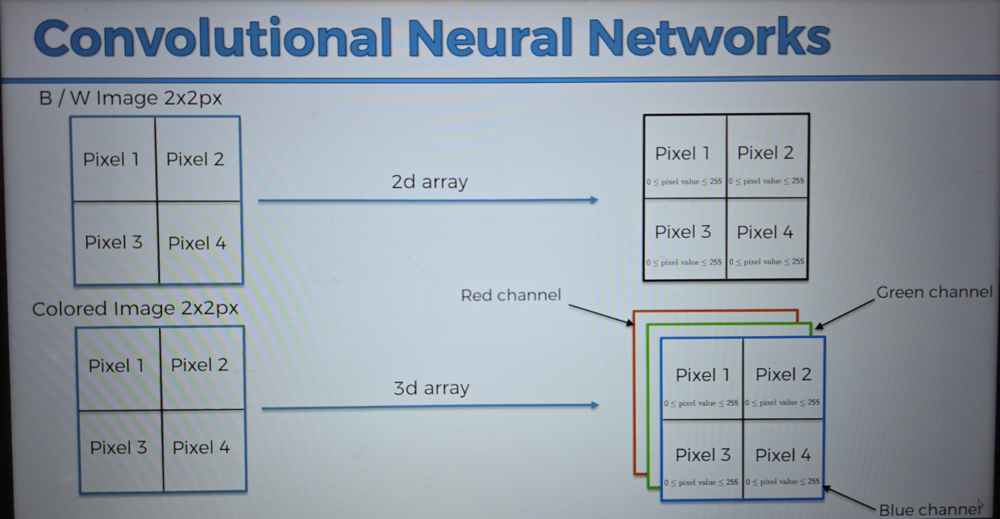

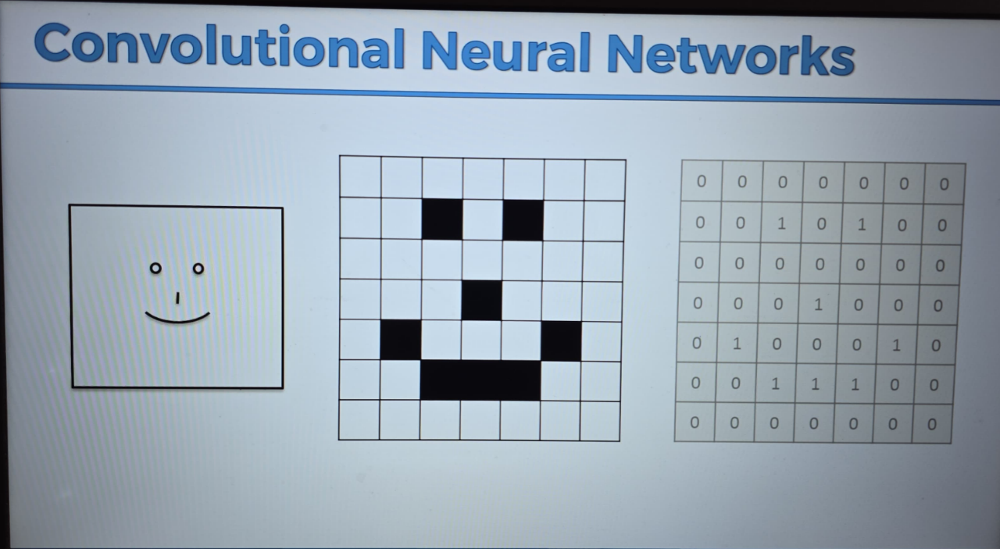

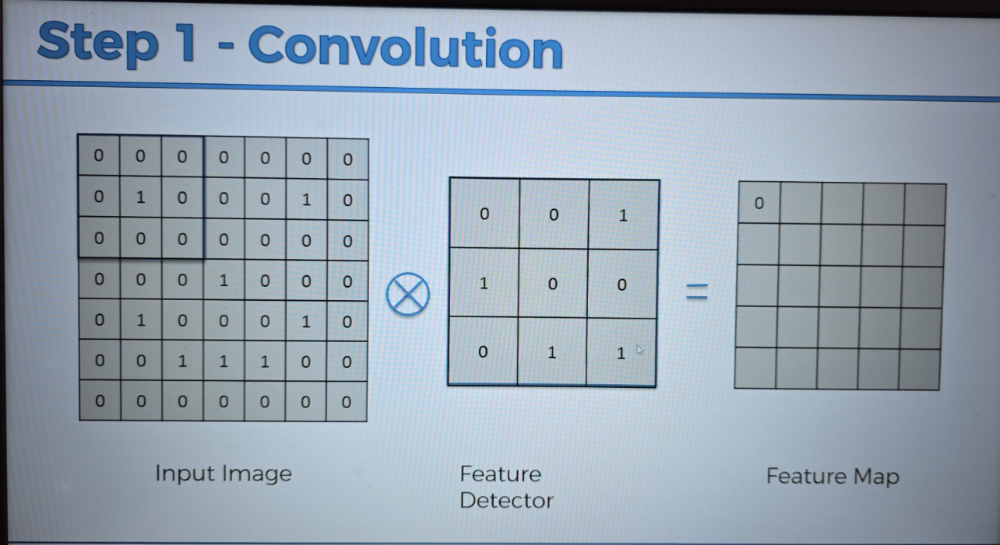

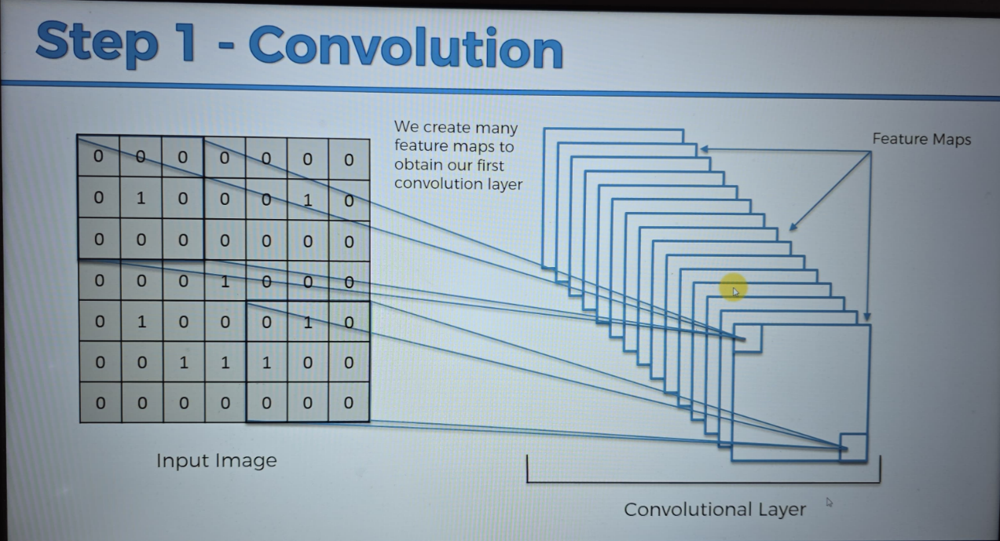

## Filters by the feature Maps : 

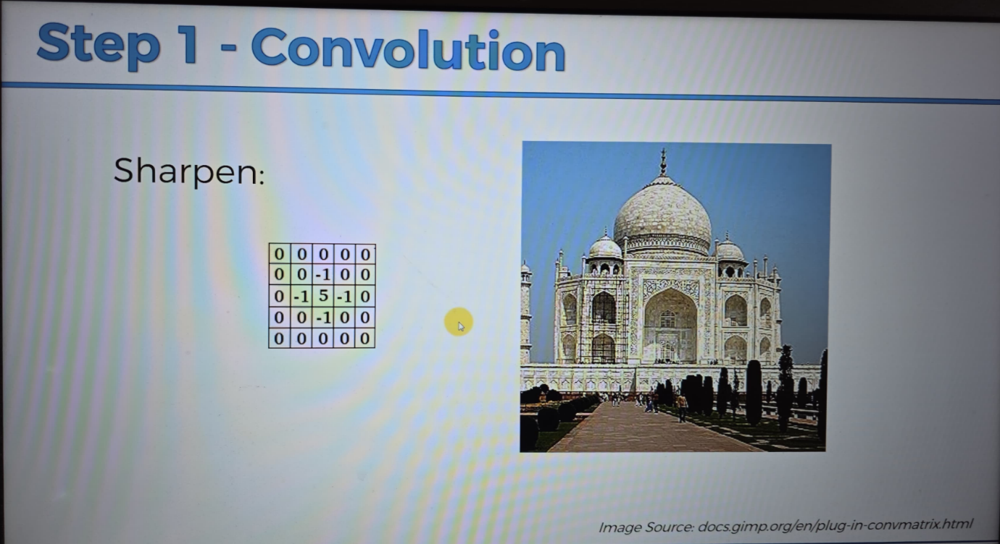

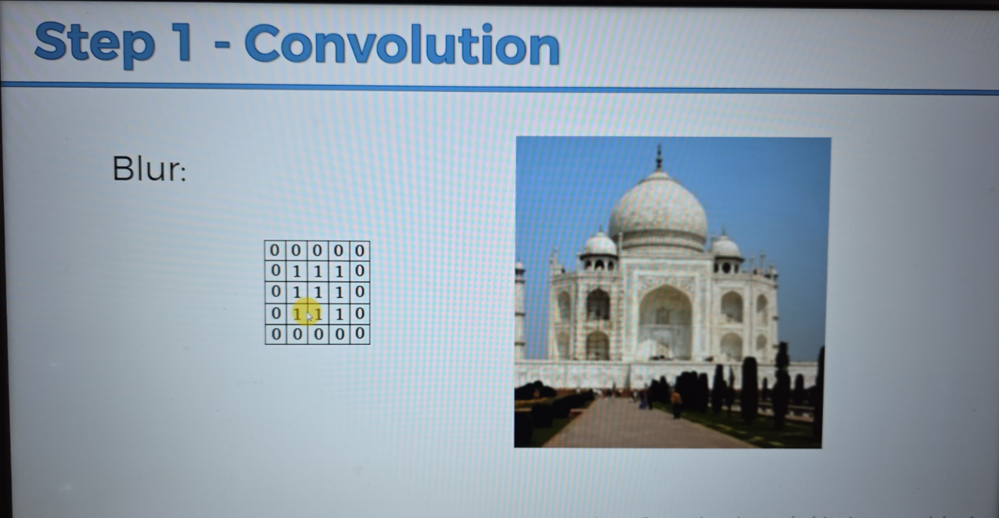
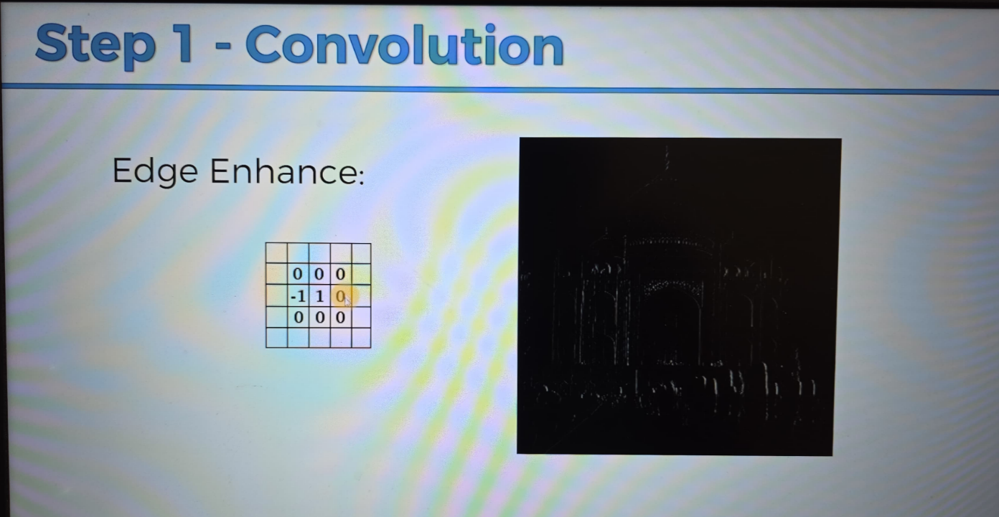
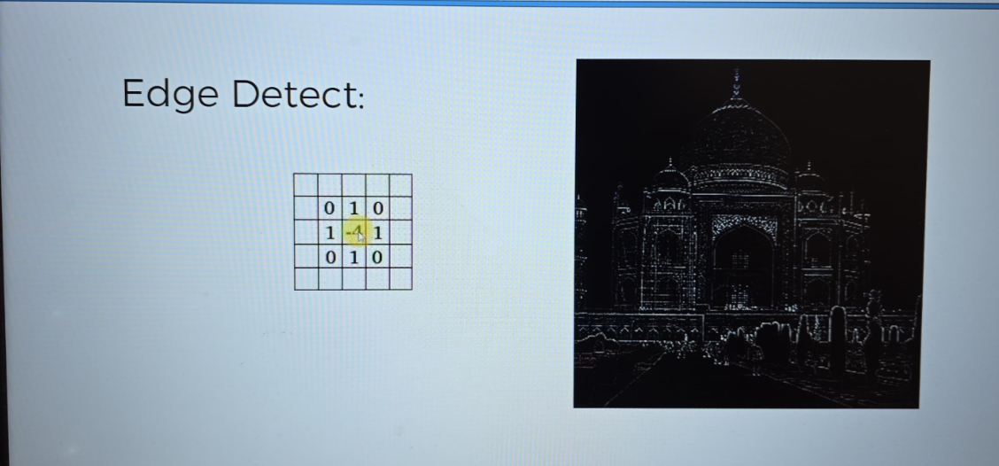
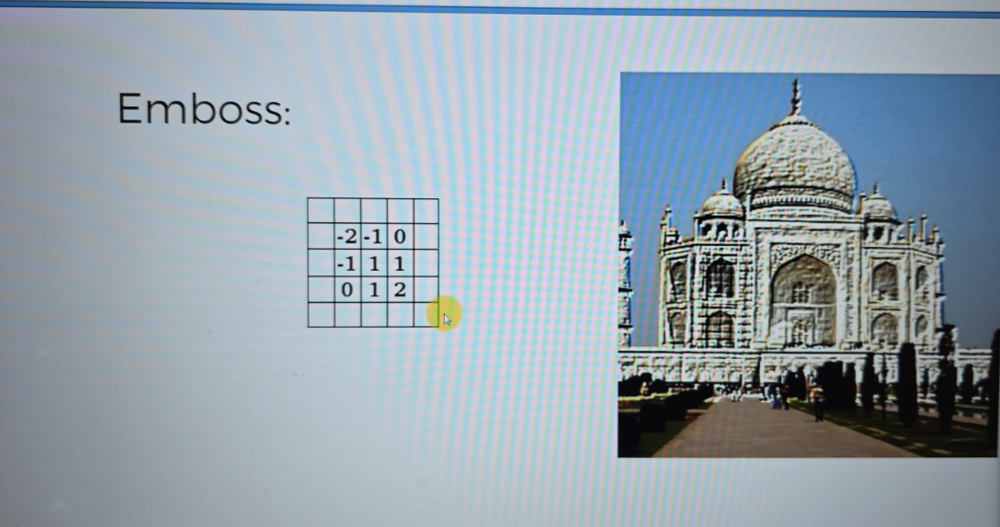
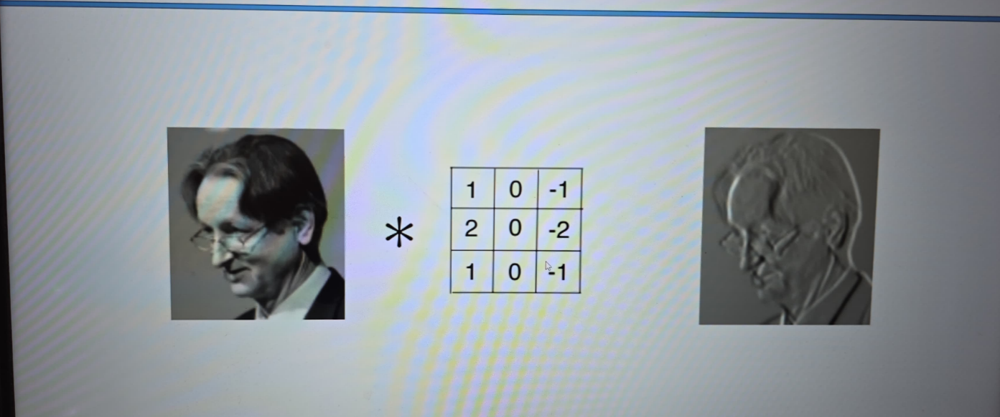

## Pooling 
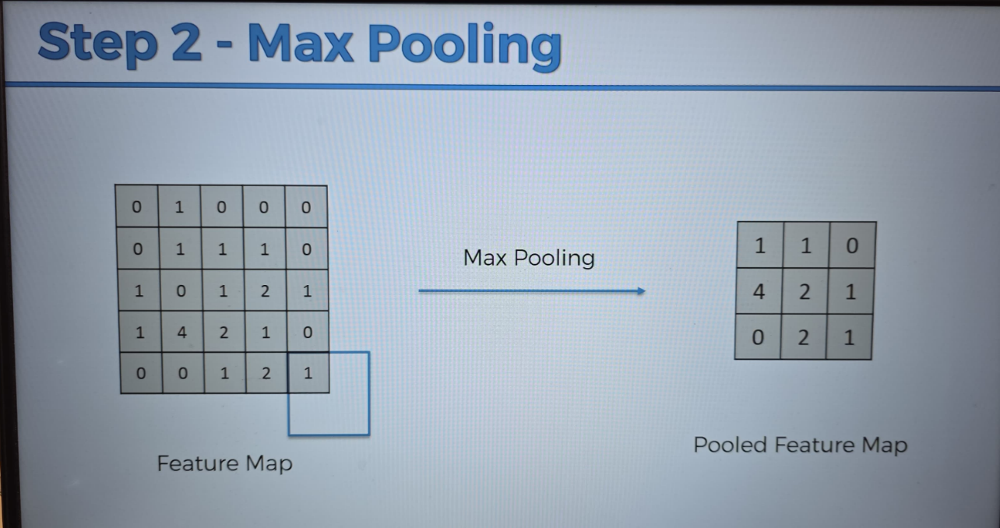

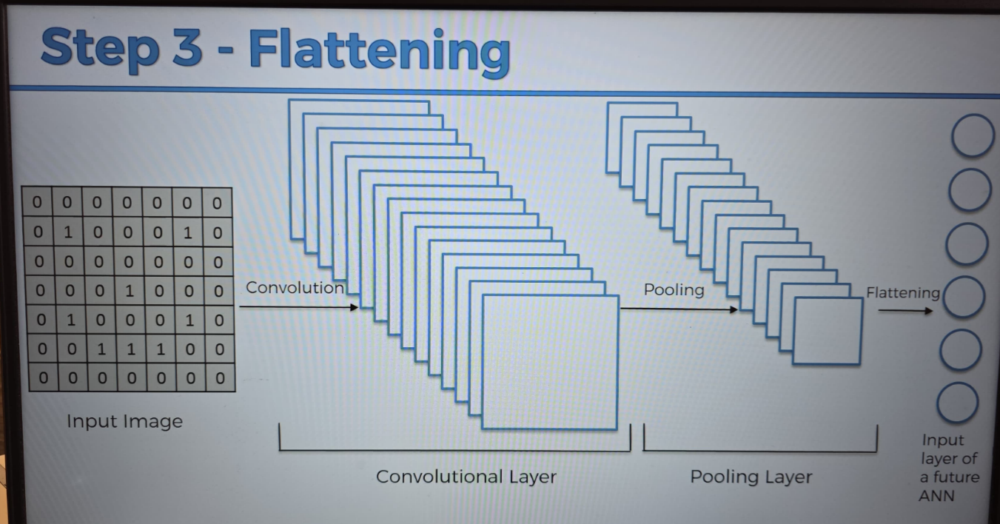

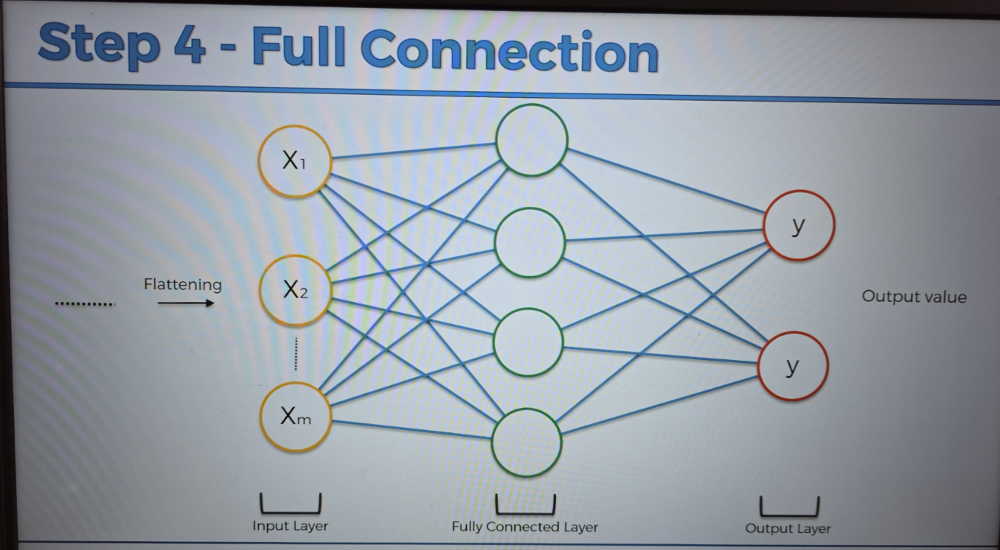